In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
import numpy as np
import tensorflow as tf
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
from matplotlib import pyplot as plt
from matplotlib.colors import LogNorm

sys.path.insert(1, os.path.join(sys.path[0], ".."))
from reproduction.pipeline.load import load_data
from reproduction import analysis
import sklearn
from scipy.stats import wasserstein_distance

In [66]:
from reproduction.pipeline import into_record

In [2]:
# open/closed cell data dir
CLOSEDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN01MOD09GA_close"
CLOSEDS = CLOSEDATADIR+"/closed.tfrecord"
OPENDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN01MOD09GA_open"
OPENS = OPENDATADIR+"/open.tfrecord"

# same brightness but no texture to open/closed cell data dir
BCLOSEDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN30MOD09GA_ambiguous_closed"
BCLOSEDS = BCLOSEDATADIR+"/bright_closed.tfrecord"
BOPENDATADIR="/home/tkurihana/scratch-midway2/clouds/2017JAN31MOD09GA_ambiguous_open"
BOPENS = BOPENDATADIR+"/bright_open.tfrecord"

# outputdata dir
OUTPUTDIR="/project/foster/clouds/output"
CENTERS = OUTPUTDIR+"/mod09cnn15b/encodings/m15b-enc.cluster_centres"
ENCODER_DEF = OUTPUTDIR+"/mod09cnn15b/encoder.json"
ENCODER_WEIGHTS = OUTPUTDIR+"/mod09cnn15b/encoder-585000.h5"
ENCODINGS = OUTPUTDIR+"/mod09cnn15b/encodings/m15b-enc"

In [3]:
centers = analysis.read_kmeans_centers(CENTERS)

In [4]:
k = KMeans(n_clusters=centers.shape[0], init=centers)

In [5]:
with open(ENCODER_DEF,"r") as f:
    encoder = tf.keras.models.model_from_json(f.read())
encoder.load_weights(ENCODER_WEIGHTS)

In [6]:
N=30  # number of patches
opens = analysis.AEData(load_data(OPENS, encoder.input_shape[1:], repeat=False), n=N)
closeds = analysis.AEData(load_data(CLOSEDS, encoder.input_shape[1:], repeat=False), n=N)
bopens = analysis.AEData(load_data(BOPENS, encoder.input_shape[1:], repeat=False), n=N)
bcloseds = analysis.AEData(load_data(BCLOSEDS, encoder.input_shape[1:], repeat=False), n=N)

In [7]:
opens.add_encoder(encoder)
closeds.add_encoder(encoder)
bopens.add_encoder(encoder)
bcloseds.add_encoder(encoder)

In [8]:
#  cluster
k.cluster_centers_ = centers

In [9]:
# Number of Clusters 
num_clusters = 10

In [10]:
# Append
oc = np.append(opens.encs,closeds.encs, axis=0)
boc = np.append(bopens.encs,bcloseds.encs, axis=0)

In [11]:
both = np.append(oc, boc,  axis=0)

In [12]:
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, bo, bc = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

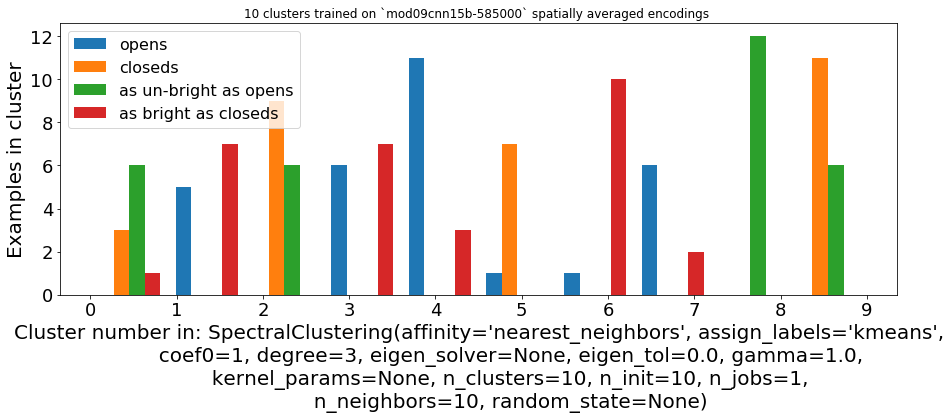

In [18]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,bo, bc], bins=num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

# Plot neighborhoods

In [31]:
def _get_imgs(dataset, ae=None, fields=None, n=500):
        # get data from dataset
        names, coords, imgs = [], [], []
        batch = dataset.make_one_shot_iterator().get_next()
        with tf.Session() as sess:
            while len(imgs) < n:
                names_, coords_, imgs_ = sess.run(batch)
                names.extend(names_)
                coords.extend(coords_)
                imgs.extend(imgs_)
        return imgs

In [64]:
def _stats(img_list,img_array):
    sum_ratio = [] 
    for i in range(len(img_list)):
        ratio = into_record.get_blob_ratio(img_array[i])
        print(i, ratio)
        sum_ratio += [ratio]
    mean = np.mean(sum_ratio)
    std= np.std(sum_ratio)
    return mean, std

In [115]:
def _stats_dev(img_list,img_array, isprint=False):
    sum_ratio = [] 
    '''
    dev : len(img_list) to img_list ==> get only necessary images by index
    '''
    for i in img_list:
        ratio = into_record.get_blob_ratio(img_array[i])
        if isprint:
            print(i, ratio)
        sum_ratio += [ratio]
    mean = np.mean(sum_ratio)
    std= np.std(sum_ratio)
    return mean, std

## Cluster 0

In [29]:
cluster = 0
context_width=128
override_base_folder=None
for j in np.argwhere(c == cluster):
    print( "%d th picture" %j) 
    p, orig = closeds.open_neighborhood(i, context_width, override_base_folder)
    print(p.shape)
    print(np.asarray(orig).shape)
    #closeds.plot_neighborhood(j[0],context_width=512)

1 th picture
(7, 384, 378)
(2,)
12 th picture
(7, 384, 378)
(2,)
13 th picture
(7, 384, 378)
(2,)


1 th picture
12 th picture
13 th picture


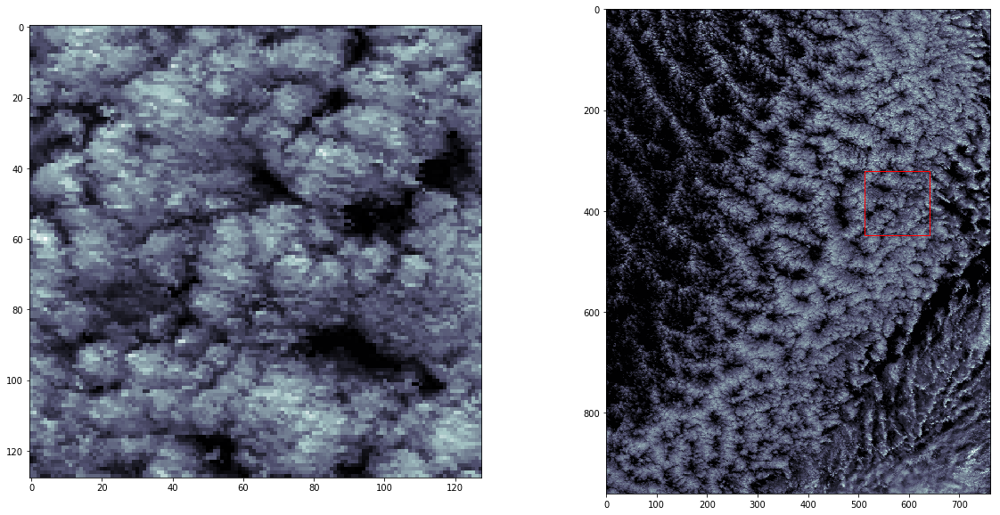

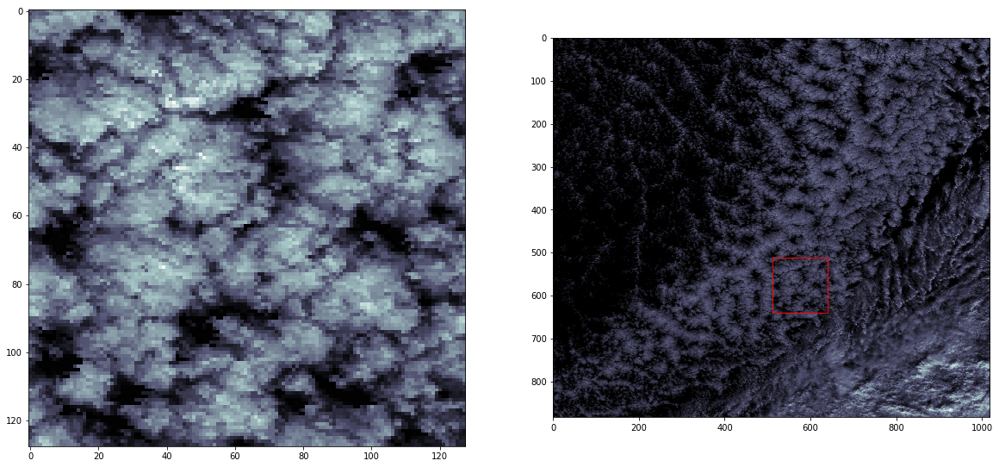

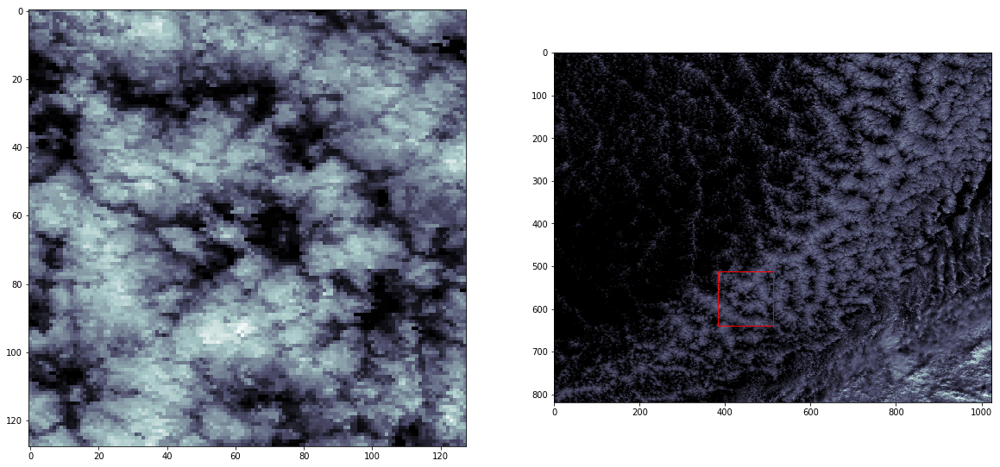

In [54]:
cluster = 0
for j in np.argwhere(c == cluster):
    print( "%d th picture" %j) 
    closeds.plot_neighborhood(j[0],context_width=512)

In [61]:
cimgs = _get_imgs(load_data(CLOSEDS, encoder.input_shape[1:], repeat=False), n=30)

In [62]:
cimgs_array=np.asarray(cimgs)

 1 th image / White Ratio =  90.563965 
 12 th image / White Ratio =  88.415527 
 13 th image / White Ratio =  87.951660 


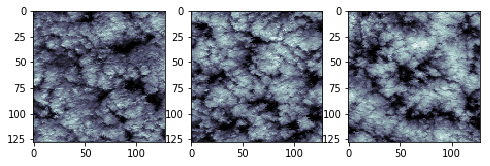

In [68]:
plt.figure(figsize=(8,6))
cluster = 0
for jx, j in enumerate(np.argwhere(c == cluster)):
    ax = plt.subplot(1,3,jx+1)
    ratio = into_record.get_blob_ratio(cimgs_array[j[0]])
    print( " %d th image / White Ratio =  %f " %( j[0], ratio ))
    plt.imshow(cimgs_array[j[0],:,:,0], norm=None, cmap="bone")

plt.show()

### TODO: Bug? plot images are rotated

In [69]:
bcimgs = _get_imgs(load_data(BCLOSEDS, encoder.input_shape[1:], repeat=False), n=30)
bcimgs_array = np.asarray(bcimgs)

 0 th image / White Ratio =  96.301270 


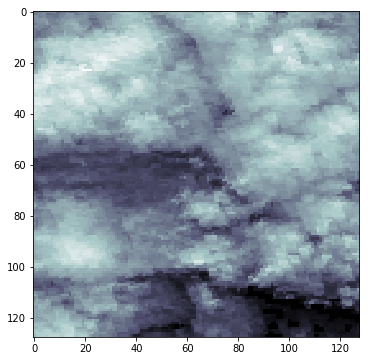

In [70]:
plt.figure(figsize=(8,6))
cluster = 0
for jx, j in enumerate(np.argwhere(bc == cluster)):
    ax = plt.subplot(1,1,jx+1)
    ratio = into_record.get_blob_ratio(bcimgs_array[j[0]])
    print( " %d th image / White Ratio =  %f " %( j[0], ratio ))
    plt.imshow(bcimgs_array[j[0],:,:,0], norm=None, cmap="bone")

plt.show()

In [71]:
boimgs = _get_imgs(load_data(BOPENS, encoder.input_shape[1:], repeat=False), n=30)
boimgs_array = np.asarray(boimgs)

 1 th image / White Ratio =  34.893799 
 12 th image / White Ratio =  36.981201 
 16 th image / White Ratio =  34.338379 
 18 th image / White Ratio =  36.956787 
 20 th image / White Ratio =  35.864258 
 29 th image / White Ratio =  36.071777 


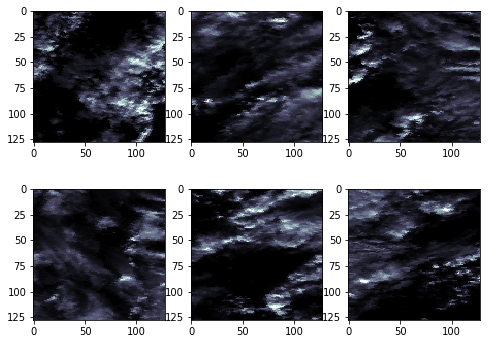

In [72]:
plt.figure(figsize=(8,6))
cluster = 0
for jx, j in enumerate(np.argwhere(bo == cluster)):
    ax = plt.subplot(2,3,jx+1)
    ratio = into_record.get_blob_ratio(boimgs_array[j[0]])
    print( " %d th image / White Ratio =  %f " %( j[0], ratio ))
    plt.imshow(boimgs_array[j[0],:,:,0], norm=None, cmap="bone")

plt.show()

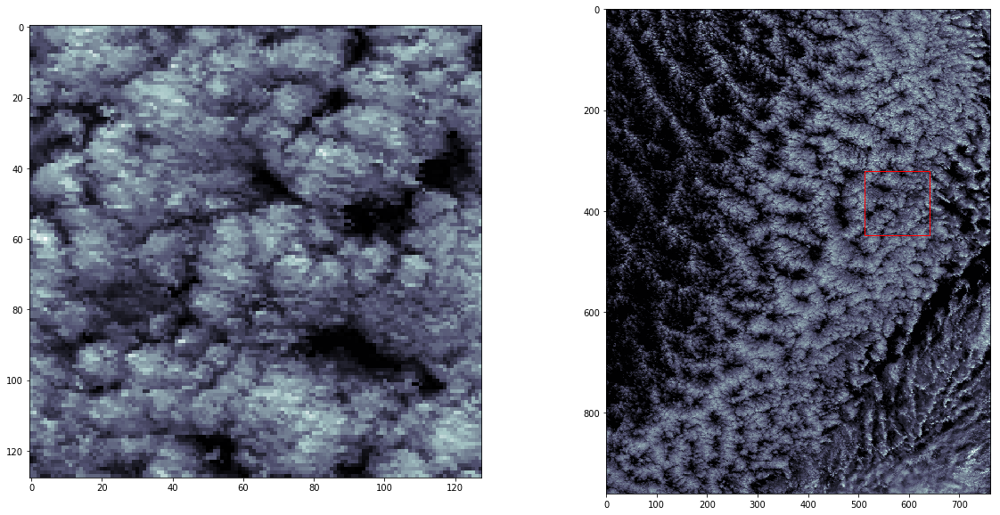

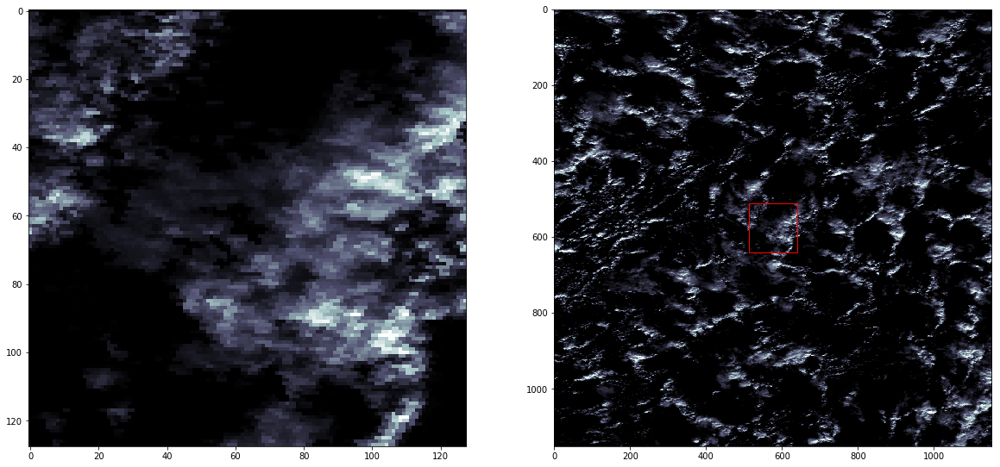

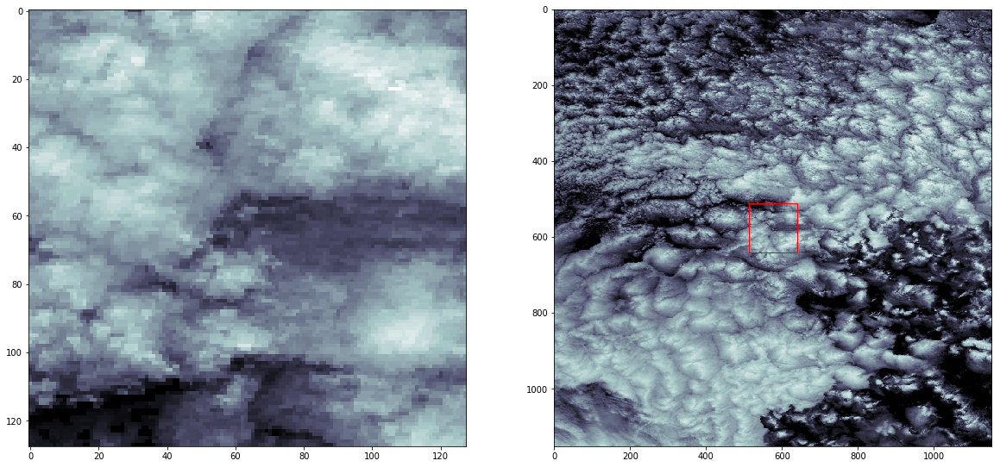

In [74]:
cluster = 0

#i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(bo == cluster)[0,0]
l = np.argwhere(bc == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
bopens.plot_neighborhood(k,context_width=512)
bcloseds.plot_neighborhood(l,context_width=512)

## Cluster 1

In [73]:
oimgs = _get_imgs(load_data(OPENS, encoder.input_shape[1:], repeat=False), n=30)
oimgs_array = np.asarray(oimgs)

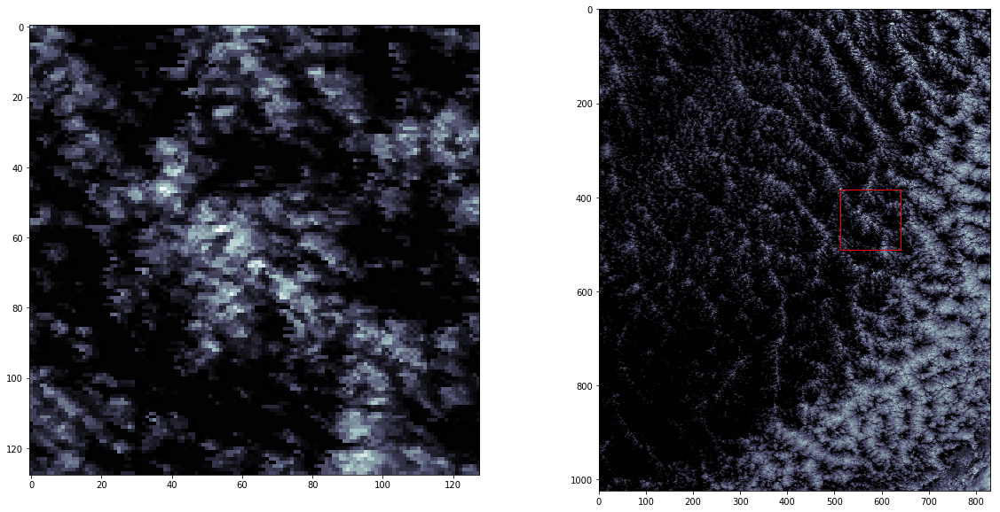

In [76]:
cluster = 1
i = np.argwhere(o == cluster)[0,0]
opens.plot_neighborhood(i,context_width=512)

In [83]:
def _plot_img_ratio(clus, ncluster, imgs_array, row, col):
    plt.figure(figsize=(8,6))
    cluster = ncluster
    for jx, j in enumerate(np.argwhere(clus == cluster)):
        ax = plt.subplot(row,col,jx+1)
        ratio = into_record.get_blob_ratio(imgs_array[j[0]])
        print( " %d th image / White Ratio =  %f " %( j[0], ratio ))
        plt.imshow(imgs_array[j[0],:,:,0], norm=None, cmap="bone")
    plt.show()

In [80]:
len(np.argwhere(o==1))

5

In [89]:
np.argwhere(o == 1)[:,0] 

array([ 2,  6, 20, 22, 25])

 2 th image / White Ratio =  38.433838 
 6 th image / White Ratio =  39.392090 
 20 th image / White Ratio =  38.800049 
 22 th image / White Ratio =  40.014648 
 25 th image / White Ratio =  40.454102 


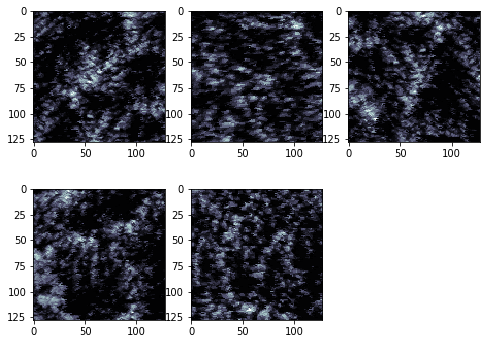

In [84]:
_plot_img_ratio(o,1, oimgs_array, 2,3)

# Cluster and white ratio

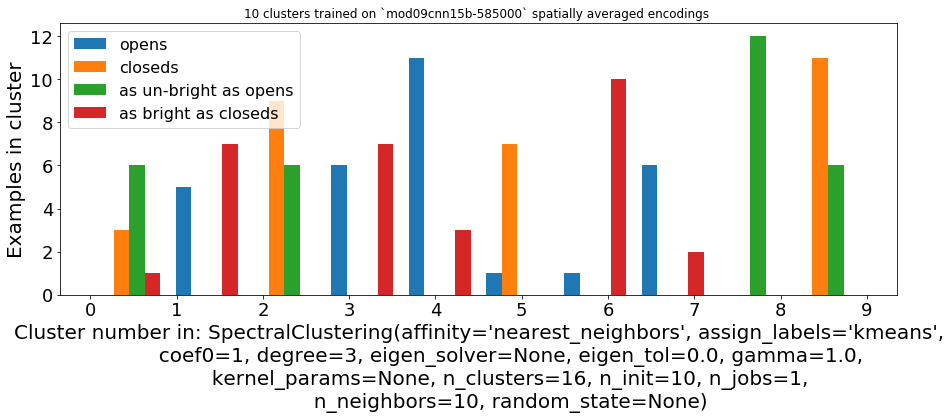

In [148]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([o,c,bo, bc], bins=num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

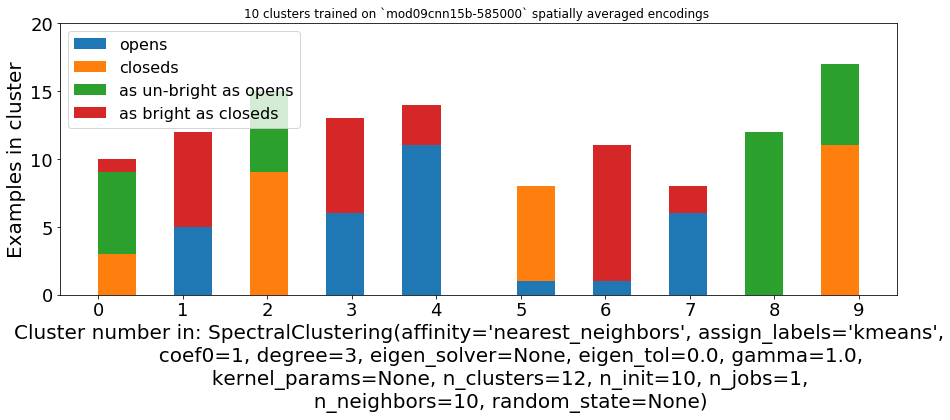

In [187]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([o,c,bo, bc], bins=num_clusters*2, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"],
         stacked=True
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.yticks([0,5,10,15,20])
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

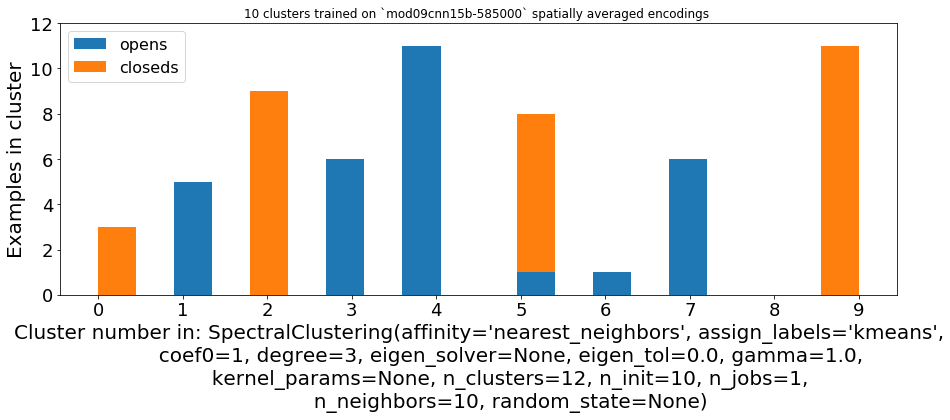

In [194]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([o,c], bins=num_clusters*2, 
         label=["opens", "closeds"],
         stacked=True
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.yticks(np.linspace(0,12,7))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

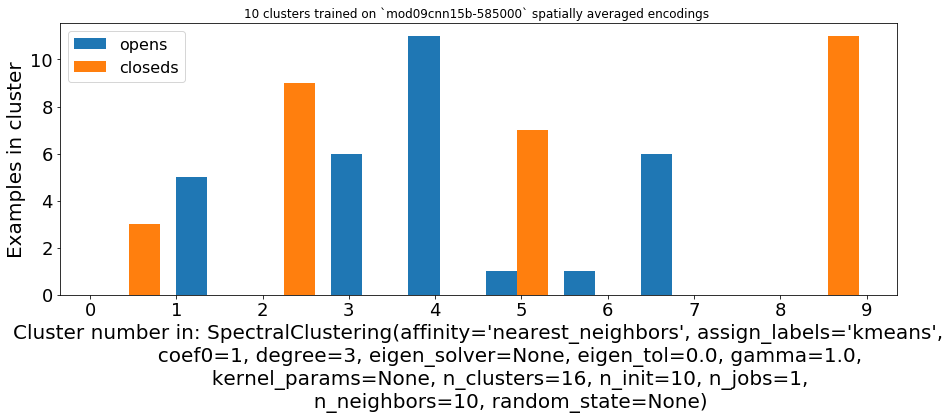

In [149]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([o,c], bins=num_clusters, 
         label=["opens", "closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

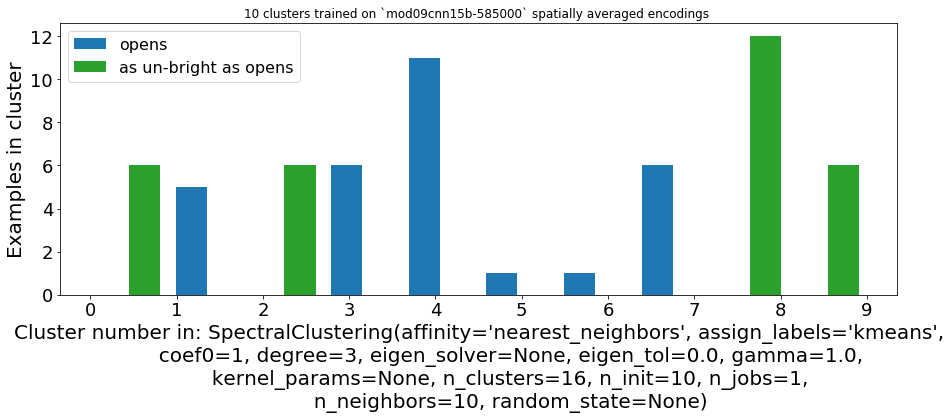

In [154]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([o,bo], bins=num_clusters, 
         label=["opens",  "as un-bright as opens"],
         color = ['#1f77b4','#2ca02c']
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

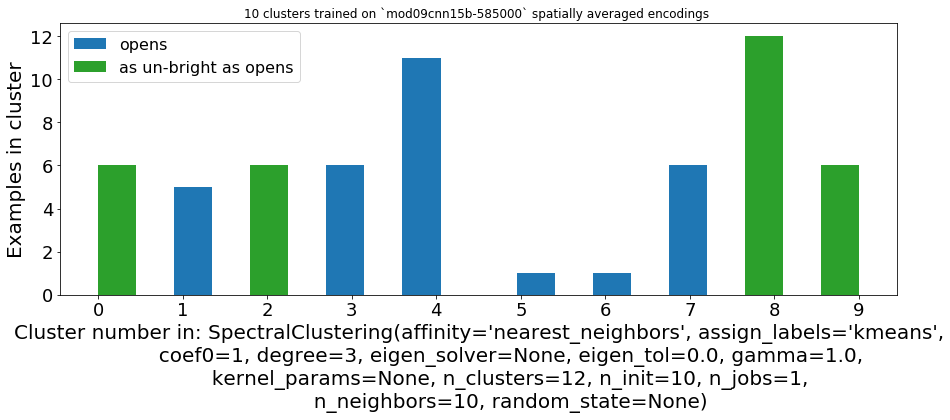

In [197]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([o,bo], bins=num_clusters*2, 
         label=["opens",  "as un-bright as opens"],
         color = ['#1f77b4','#2ca02c'], stacked=True
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

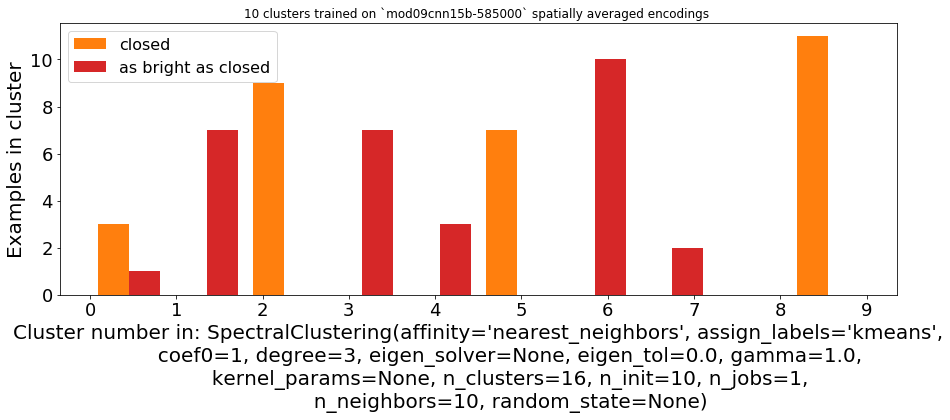

In [156]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([c,bc], bins=num_clusters, 
         label=["closed",  "as bright as closed"],
         color = ['#ff7f0e','#d62728']
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

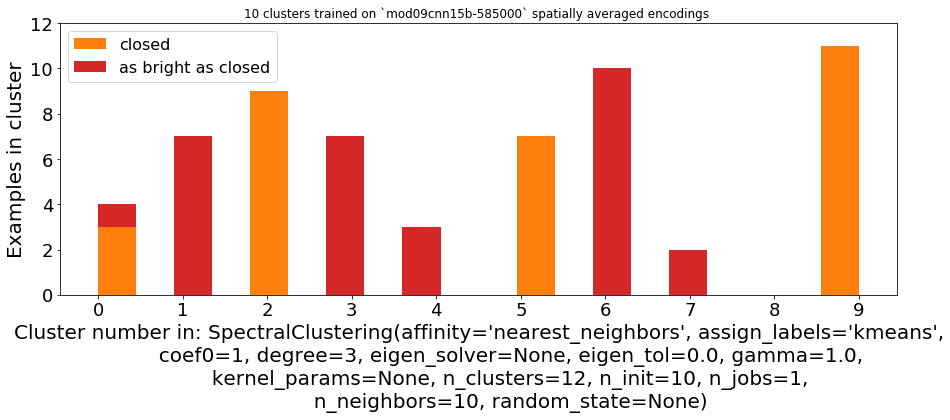

In [199]:
# Fig
plt.figure(figsize=(15, 5))
plt.hist([c,bc], bins=num_clusters*2, 
         label=["closed",  "as bright as closed"],
         color = ['#ff7f0e','#d62728'], stacked=True
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.yticks(np.linspace(0,12,7))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

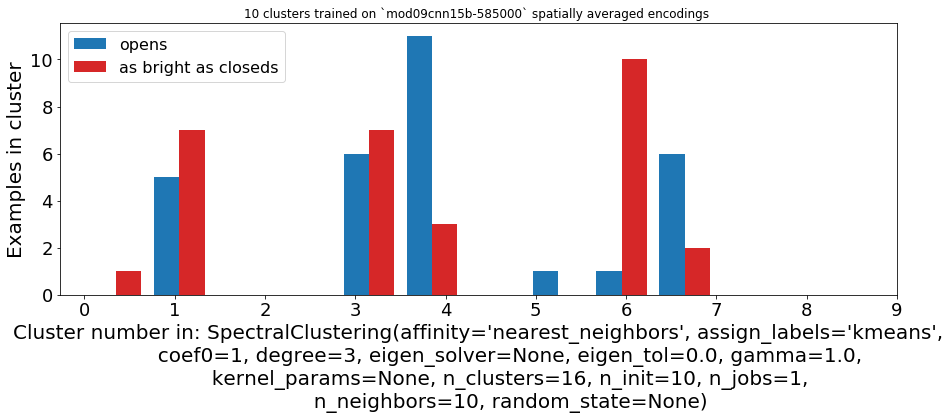

In [157]:
# Fig mutual
plt.figure(figsize=(15, 5))
plt.hist([o,bc], bins=num_clusters, 
         label=["opens",  "as bright as closeds"],
         color = ['#1f77b4','#d62728']
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

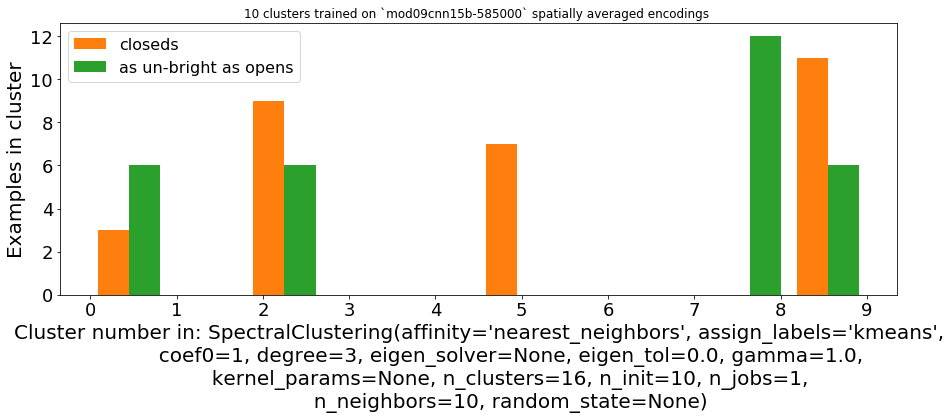

In [158]:
# Fig mutual
plt.figure(figsize=(15, 5))
plt.hist([c,bo], bins=num_clusters, 
         label=["closeds",  "as un-bright as opens"],
         color = ['#ff7f0e','#2ca02c']
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

In [139]:
def _compute_white_ratio(_cluster,imgs_array,num_clusters,cname='NONE'):
    ''' compute mean stdv white blob ratio in each cluster'''
    cluster_list = [_cluster]
    bool_print=False # True see all vals
    for iclus in range(num_clusters) :
        for cluster in cluster_list:
            img_list = []
            if len(np.argwhere(_cluster == iclus)) > 0:
                img_list  = np.argwhere(_cluster == iclus)[:,0]
                mean, std = _stats_dev(img_list, imgs_array, isprint=bool_print)
                print(" %s cell:  Clus = %d/ Mean = %f / STDV =  %f / Num. of cluster = %d " %(cname, iclus, mean, std, len(img_list)))

In [140]:
_compute_white_ratio(o,oimgs_array,num_clusters,cname='open')

 open cell:  Clus = 1/ Mean = 39.418945 / STDV =  0.745735 / Num. of cluster = 5 
 open cell:  Clus = 3/ Mean = 56.257121 / STDV =  2.561779 / Num. of cluster = 6 
 open cell:  Clus = 4/ Mean = 32.569469 / STDV =  3.169393 / Num. of cluster = 11 
 open cell:  Clus = 5/ Mean = 68.829346 / STDV =  0.000000 / Num. of cluster = 1 
 open cell:  Clus = 6/ Mean = 44.689941 / STDV =  0.000000 / Num. of cluster = 1 
 open cell:  Clus = 7/ Mean = 52.567546 / STDV =  2.549579 / Num. of cluster = 6 


In [141]:
clist = [o,c,bo,bc]
array_list = [oimgs_array, cimgs_array, boimgs_array, bcimgs_array]
name_list = ['Open', 'Closed', 'As un-bright as open', 'As bright as closed']
for icluster, imgs_array, iname in zip(clist, array_list, name_list):
    _compute_white_ratio( icluster,imgs_array,num_clusters,cname=iname)

 Open cell:  Clus = 1/ Mean = 39.418945 / STDV =  0.745735 / Num. of cluster = 5 
 Open cell:  Clus = 3/ Mean = 56.257121 / STDV =  2.561779 / Num. of cluster = 6 
 Open cell:  Clus = 4/ Mean = 32.569469 / STDV =  3.169393 / Num. of cluster = 11 
 Open cell:  Clus = 5/ Mean = 68.829346 / STDV =  0.000000 / Num. of cluster = 1 
 Open cell:  Clus = 6/ Mean = 44.689941 / STDV =  0.000000 / Num. of cluster = 1 
 Open cell:  Clus = 7/ Mean = 52.567546 / STDV =  2.549579 / Num. of cluster = 6 
 Closed cell:  Clus = 0/ Mean = 88.977051 / STDV =  1.137985 / Num. of cluster = 3 
 Closed cell:  Clus = 2/ Mean = 95.064969 / STDV =  2.124865 / Num. of cluster = 9 
 Closed cell:  Clus = 5/ Mean = 78.994315 / STDV =  2.292028 / Num. of cluster = 7 
 Closed cell:  Clus = 9/ Mean = 88.144753 / STDV =  1.896585 / Num. of cluster = 11 
 As un-bright as open cell:  Clus = 0/ Mean = 35.851034 / STDV =  0.979225 / Num. of cluster = 6 
 As un-bright as open cell:  Clus = 2/ Mean = 49.444580 / STDV =  4.2555

## N = 2

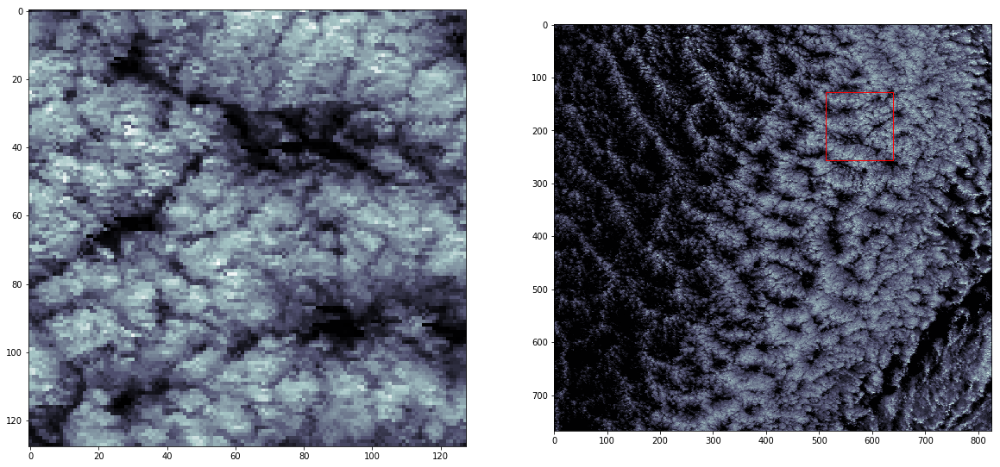

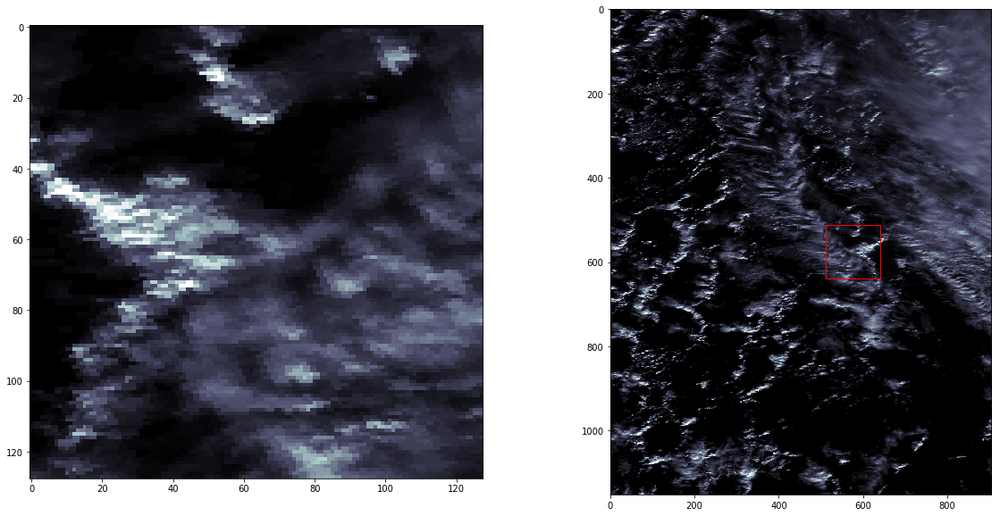

In [132]:
cluster = 2

#i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(c == cluster)[0,0]
k = np.argwhere(bo == cluster)[0,0]
# = np.argwhere(bc == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
bopens.plot_neighborhood(k,context_width=512)
#bcloseds.plot_neighborhood(l,context_width=512)

# N = 4

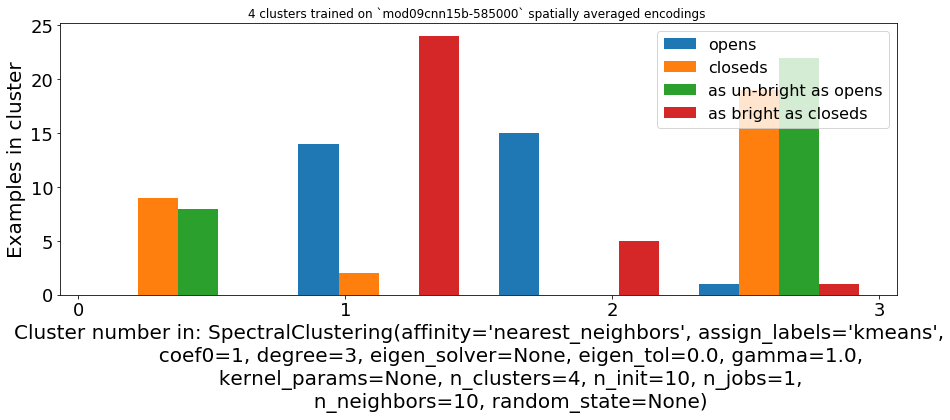

In [165]:
# Number of Clusters 
_num_clusters = 4
# Append
_oc = np.append(opens.encs,closeds.encs, axis=0)
_boc = np.append(bopens.encs,bcloseds.encs, axis=0)
_both = np.append(_oc, _boc,  axis=0)
#
method = SpectralClustering(n_clusters=_num_clusters, affinity="nearest_neighbors")
_clusters = method.fit_predict(_both)
_o, _c, _bo, _bc = _clusters[:N], _clusters[N:N*2], _clusters[N*2:N*3], _clusters[N*3:]
#
plt.figure(figsize=(15, 5))
plt.hist([_o,_c,_bo, _bc], bins=_num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(_num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(_num_clusters))
plt.legend(fontsize=16, loc='upper right')
plt.tick_params(labelsize=18)

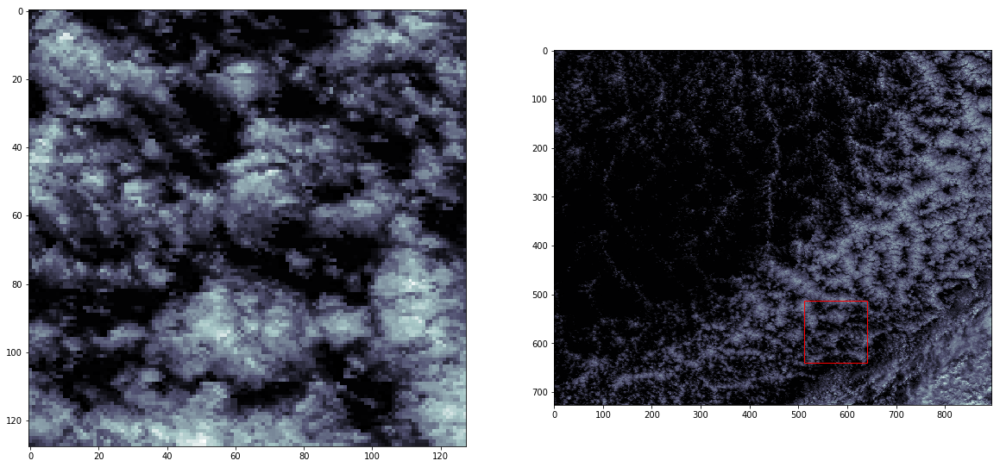

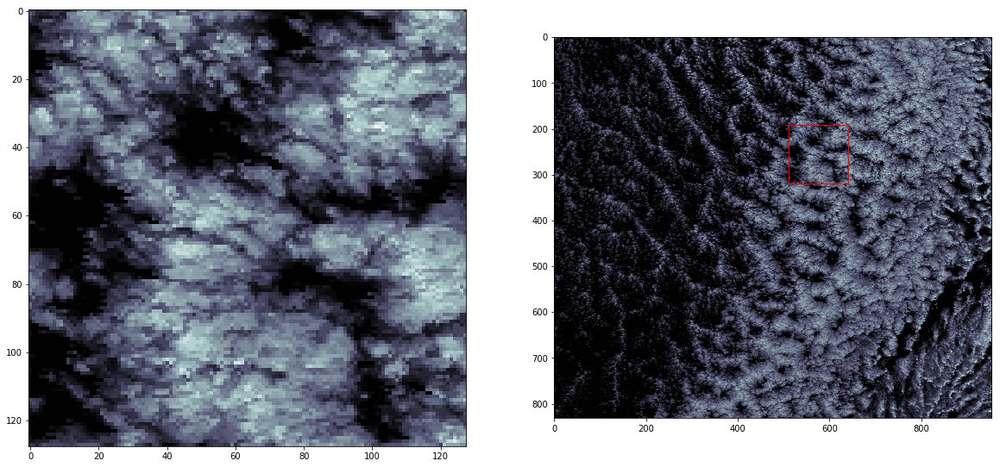

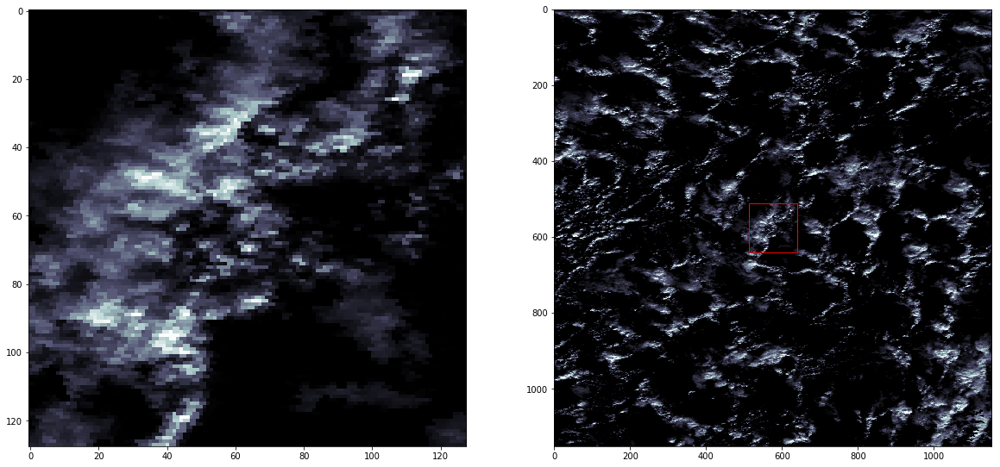

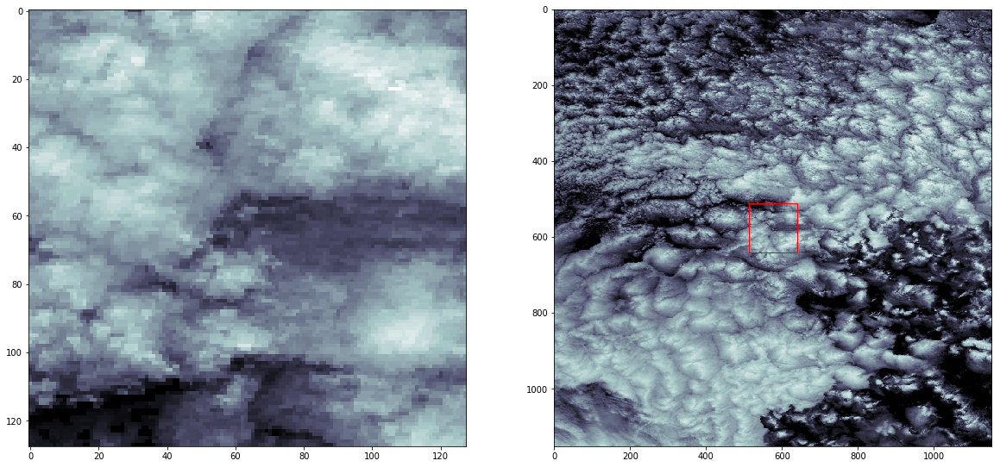

In [167]:
cluster = 3

i = np.argwhere(_o == cluster)[0,0]
j = np.argwhere(_c == cluster)[0,0]
k = np.argwhere(_bo == cluster)[0,0]
l = np.argwhere(_bc == cluster)[0,0]

opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
bopens.plot_neighborhood(k,context_width=512)
bcloseds.plot_neighborhood(l,context_width=512)

# N = 6

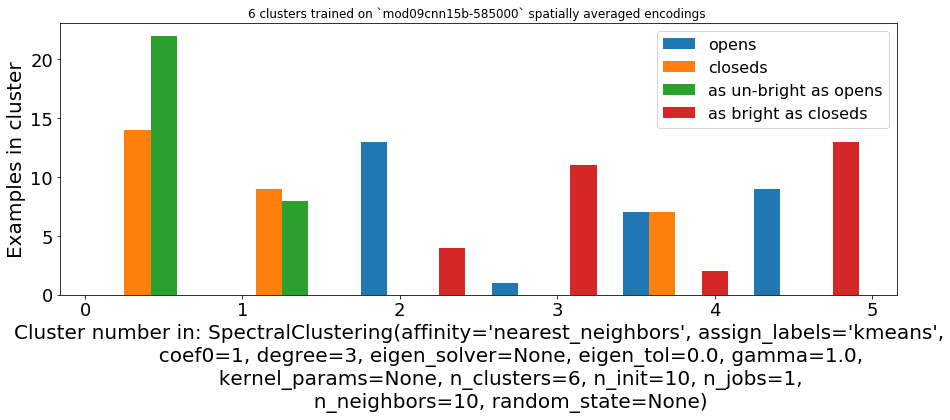

In [162]:
# Number of Clusters 
_num_clusters = 6
# Append
_oc = np.append(opens.encs,closeds.encs, axis=0)
_boc = np.append(bopens.encs,bcloseds.encs, axis=0)
_both = np.append(_oc, _boc,  axis=0)
#
method = SpectralClustering(n_clusters=_num_clusters, affinity="nearest_neighbors")
_clusters = method.fit_predict(_both)
_o, _c, _bo, _bc = _clusters[:N], _clusters[N:N*2], _clusters[N*2:N*3], _clusters[N*3:]
#
plt.figure(figsize=(15, 5))
plt.hist([_o,_c,_bo, _bc], bins=_num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(_num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(_num_clusters))
plt.legend(fontsize=16, loc='upper right')
plt.tick_params(labelsize=18)

# N = 8

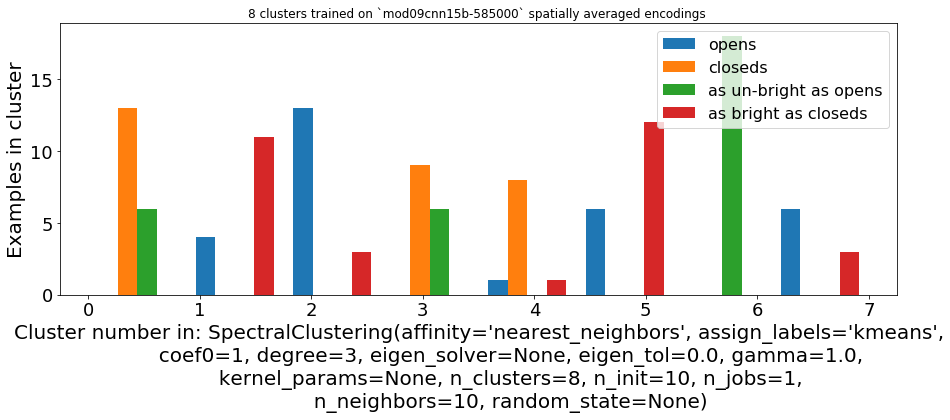

In [161]:
# Number of Clusters 
_num_clusters = 8
# Append
_oc = np.append(opens.encs,closeds.encs, axis=0)
_boc = np.append(bopens.encs,bcloseds.encs, axis=0)
_both = np.append(_oc, _boc,  axis=0)
#
method = SpectralClustering(n_clusters=_num_clusters, affinity="nearest_neighbors")
_clusters = method.fit_predict(_both)
_o, _c, _bo, _bc = _clusters[:N], _clusters[N:N*2], _clusters[N*2:N*3], _clusters[N*3:]
#
plt.figure(figsize=(15, 5))
plt.hist([_o,_c,_bo, _bc], bins=_num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(_num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(_num_clusters))
plt.legend(fontsize=16, loc='upper right')
plt.tick_params(labelsize=18)

# N = 12

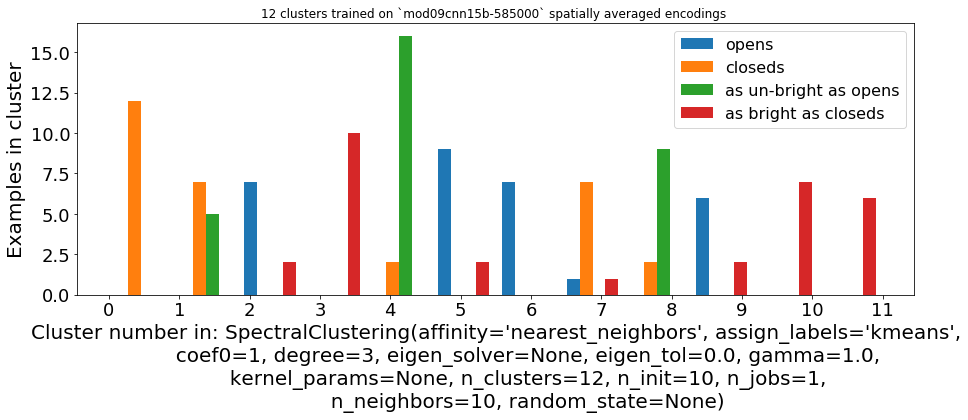

In [168]:
# Number of Clusters 
_num_clusters = 12
# Append
_oc = np.append(opens.encs,closeds.encs, axis=0)
_boc = np.append(bopens.encs,bcloseds.encs, axis=0)
_both = np.append(_oc, _boc,  axis=0)
#
method = SpectralClustering(n_clusters=_num_clusters, affinity="nearest_neighbors")
_clusters = method.fit_predict(_both)
_o, _c, _bo, _bc = _clusters[:N], _clusters[N:N*2], _clusters[N*2:N*3], _clusters[N*3:]
#
plt.figure(figsize=(15, 5))
plt.hist([_o,_c,_bo, _bc], bins=_num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(_num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(_num_clusters))
plt.legend(fontsize=16, loc='upper right')
plt.tick_params(labelsize=18)

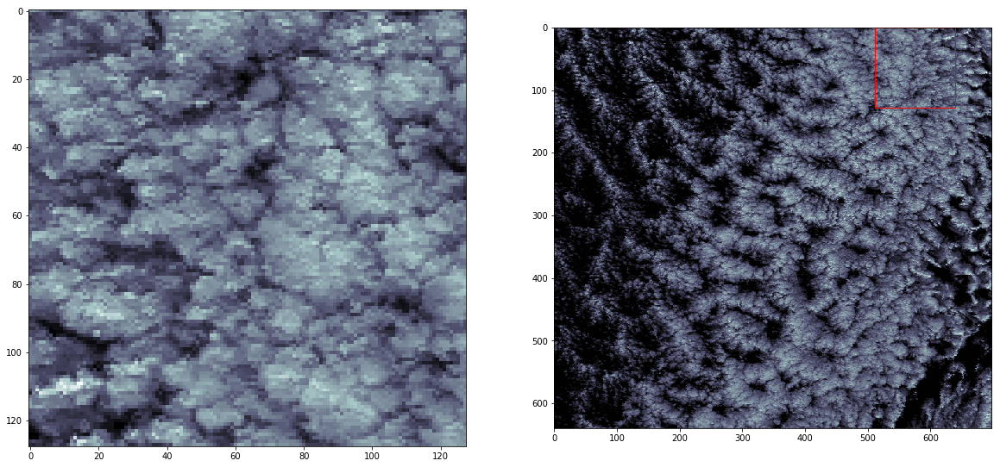

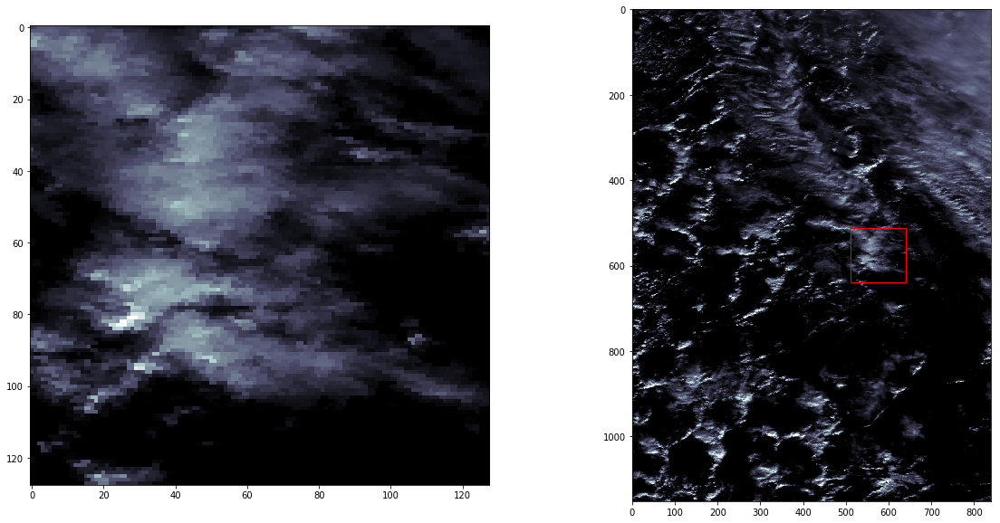

In [170]:
cluster = 1

#i = np.argwhere(o == cluster)[0,0]
j = np.argwhere(_c == cluster)[2,0]
k = np.argwhere(_bo == cluster)[2,0]
# = np.argwhere(bc == cluster)[0,0]

#opens.plot_neighborhood(i,context_width=512)
closeds.plot_neighborhood(j,context_width=512)
bopens.plot_neighborhood(k,context_width=512)
#bcloseds.plot_neighborhood(l,context_width=512)

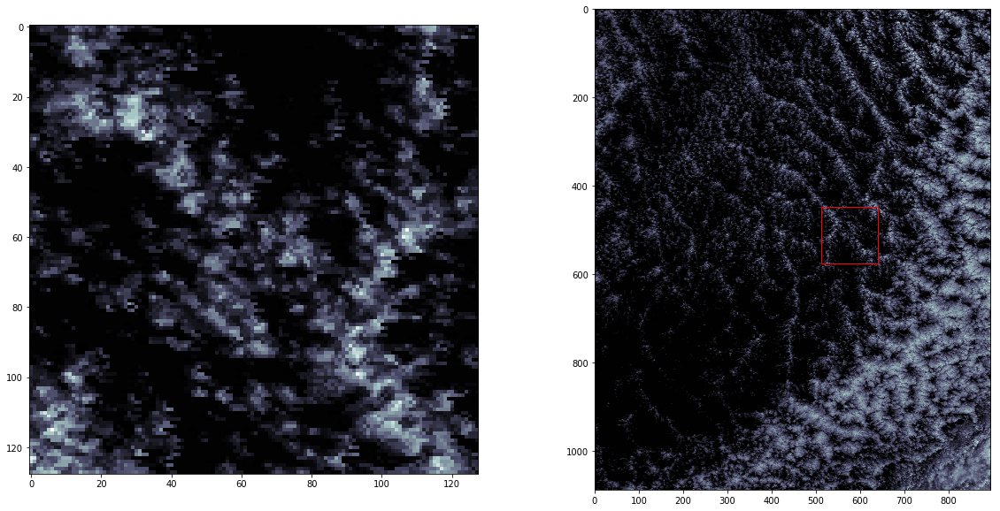

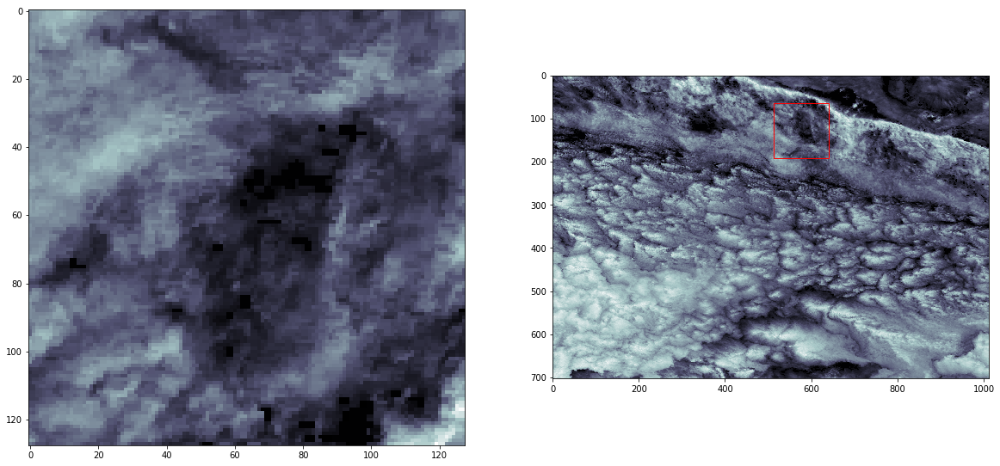

In [174]:
cluster = 5

i = np.argwhere(_o == cluster)[1,0]
#j = np.argwhere(_c == cluster)[1,0]
#k = np.argwhere(_bo == cluster)[1,0]
l = np.argwhere(_bc == cluster)[1,0]

opens.plot_neighborhood(i,context_width=512)
#closeds.plot_neighborhood(j,context_width=512)
#bopens.plot_neighborhood(k,context_width=512)
bcloseds.plot_neighborhood(l,context_width=512)

# N = 14

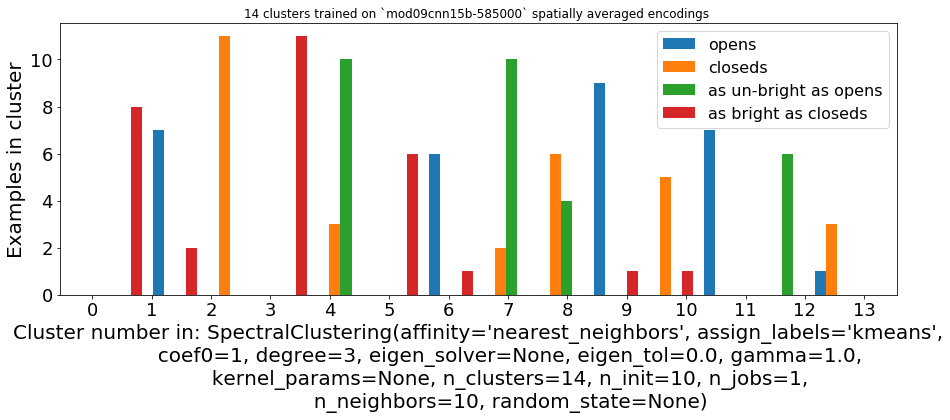

In [164]:
# Number of Clusters 
_num_clusters = 14
# Append
_oc = np.append(opens.encs,closeds.encs, axis=0)
_boc = np.append(bopens.encs,bcloseds.encs, axis=0)
_both = np.append(_oc, _boc,  axis=0)
#
method = SpectralClustering(n_clusters=_num_clusters, affinity="nearest_neighbors")
_clusters = method.fit_predict(_both)
_o, _c, _bo, _bc = _clusters[:N], _clusters[N:N*2], _clusters[N*2:N*3], _clusters[N*3:]
#
plt.figure(figsize=(15, 5))
plt.hist([_o,_c,_bo, _bc], bins=_num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(_num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(_num_clusters))
plt.legend(fontsize=16, loc='upper right')
plt.tick_params(labelsize=18)

# N = 16

In [91]:
# Number of Clusters 
_num_clusters = 16

In [92]:
# Append
_oc = np.append(opens.encs,closeds.encs, axis=0)
_boc = np.append(bopens.encs,bcloseds.encs, axis=0)

In [93]:
_both = np.append(_oc, _boc,  axis=0)

In [97]:
method = SpectralClustering(n_clusters=_num_clusters, affinity="nearest_neighbors")
_clusters = method.fit_predict(_both)
_o, _c, _bo, _bc = _clusters[:N], _clusters[N:N*2], _clusters[N*2:N*3], _clusters[N*3:]

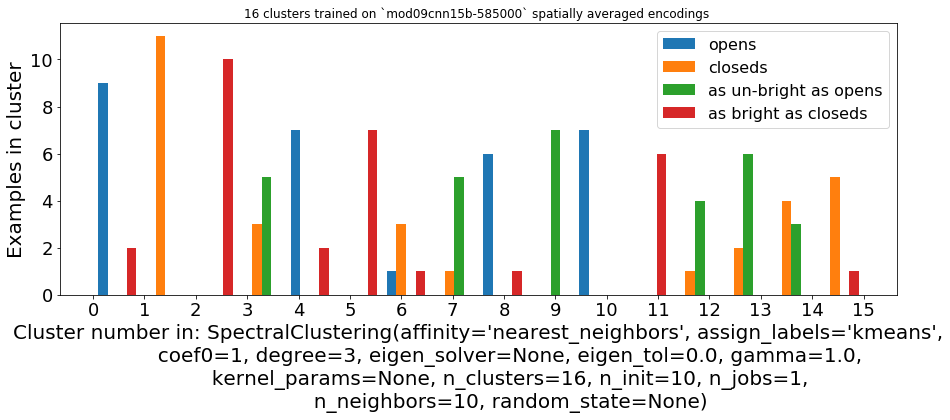

In [99]:
plt.figure(figsize=(15, 5))
plt.hist([_o,_c,_bo, _bc], bins=_num_clusters, 
         label=["opens", "closeds", "as un-bright as opens", "as bright as closeds"]
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(_num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod09cnn15b-585000` spatially averaged encodings "%(_num_clusters))
plt.legend(fontsize=16, loc='upper right')
plt.tick_params(labelsize=18)

In [159]:
clist = [_o,_c,_bo,_bc]
array_list = [oimgs_array, cimgs_array, boimgs_array, bcimgs_array]
name_list = ['Open', 'Closed', 'As un-bright as open', 'As bright as closed']
for icluster, imgs_array, iname in zip(clist, array_list, name_list):
    _compute_white_ratio( icluster,imgs_array,_num_clusters,cname=iname)

 Open cell:  Clus = 0/ Mean = 37.367079 / STDV =  2.646740 / Num. of cluster = 9 
 Open cell:  Clus = 4/ Mean = 31.293597 / STDV =  3.076576 / Num. of cluster = 7 
 Open cell:  Clus = 6/ Mean = 68.829346 / STDV =  0.000000 / Num. of cluster = 1 
 Open cell:  Clus = 8/ Mean = 52.567546 / STDV =  2.549579 / Num. of cluster = 6 
 Open cell:  Clus = 10/ Mean = 54.604667 / STDV =  4.691355 / Num. of cluster = 7 
 Closed cell:  Clus = 1/ Mean = 88.191362 / STDV =  1.884931 / Num. of cluster = 11 
 Closed cell:  Clus = 3/ Mean = 93.247477 / STDV =  0.915790 / Num. of cluster = 3 
 Closed cell:  Clus = 6/ Mean = 78.798421 / STDV =  1.051888 / Num. of cluster = 3 
 Closed cell:  Clus = 7/ Mean = 90.563965 / STDV =  0.000000 / Num. of cluster = 1 
 Closed cell:  Clus = 12/ Mean = 87.438965 / STDV =  0.000000 / Num. of cluster = 1 
 Closed cell:  Clus = 13/ Mean = 94.363403 / STDV =  1.358032 / Num. of cluster = 2 
 Closed cell:  Clus = 14/ Mean = 96.778870 / STDV =  1.716604 / Num. of cluster = 